#  Binary Classification: Mushroom Dataset 

### 🍄 Binary Classification of Mushrooms: Edible or Poisonous 🍄

---

**Prepared By:**  
**Nour Ghsaier**  
*Senior Student: Information Technology and Business Analytics*  
*IT430 Machine Learning Course*  
*Tunis Business School*  
*2024-2025*

---


## 📚 Notebook Structure

### 1. **Exploratory Data Analysis (EDA)**

### 2. **Data Cleaning and Preprocessing**

### 3. **Machine Learning Algorithms**
- K-Nearest Neighbors (KNN)
- Naive Bayes
- Logistic Regression
- Support Vector Machine (SVM)
- Random Forest
- XGBoost
- CatBoost

### 4. **Deep Learning Algorithms**
- Recurrent Neural Networks (RNN)
- Neural Network
- Autoencoders for Classification


In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score
from xgboost import XGBClassifier
from sklearn import metrics
from catboost import CatBoostClassifier
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.models import Model
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# Exploratory Data Analysis (EDA)

In [3]:
df=pd.read_csv(r"C:\Users\DELL\ML_Project Binary_Classification\mushroom_dataset.csv")
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54035 entries, 0 to 54034
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cap-diameter     54035 non-null  int64  
 1   cap-shape        54035 non-null  int64  
 2   gill-attachment  54035 non-null  int64  
 3   gill-color       54035 non-null  int64  
 4   stem-height      54035 non-null  float64
 5   stem-width       54035 non-null  int64  
 6   stem-color       54035 non-null  int64  
 7   season           54035 non-null  float64
 8   class            54035 non-null  int64  
dtypes: float64(2), int64(7)
memory usage: 3.7 MB


In [6]:
df


,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1
2,1371,2,2,10,3.612496,1566,11,1.804273,1
3,1261,6,2,10,3.787572,1566,11,1.804273,1
4,1305,6,2,10,3.711971,1464,11,0.943195,1
...,...,...,...,...,...,...,...,...,...
54030,73,5,3,2,0.887740,569,12,0.943195,1
54031,82,2,3,2,1.186164,490,12,0.943195,1
54032,82,5,3,2,0.915593,584,12,0.888450,1
54033,79,2,3,2,1.034963,491,12,0.888450,1


In [7]:
df.columns

Index(['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color',
       'stem-height', 'stem-width', 'stem-color', 'season', 'class'],
      dtype='object')

In [8]:
df.describe()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
count,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000,54035.000000
mean,567.257204,4.000315,2.142056,7.329509,0.759110,1051.081299,8.418062,0.952163,0.549181
std,359.883763,2.160505,2.228821,3.200266,0.650969,782.056076,3.262078,0.305594,0.497580
min,0.000000,0.000000,0.000000,0.000000,0.000426,0.000000,0.000000,0.027372,0.000000
25%,289.000000,2.000000,0.000000,5.000000,0.270997,421.000000,6.000000,0.888450,0.000000
50%,525.000000,5.000000,1.000000,8.000000,0.593295,923.000000,11.000000,0.943195,1.000000
75%,781.000000,6.000000,4.000000,10.000000,1.054858,1523.000000,11.000000,0.943195,1.000000
max,1891.000000,6.000000,6.000000,11.000000,3.835320,3569.000000,12.000000,1.804273,1.000000


In [18]:
for i in df.columns:
    print( i , " = ", df[i].unique())
    print( i , " = ", df[i].unique().sum() , " \n")

cap-diameter  =  [1372 1461 1371 ... 1847 1851 1885]
cap-diameter  =  1708143  

cap-shape  =  [2 6 4 0 1 5 3]
cap-shape  =  21  

gill-attachment  =  [2 0 1 5 6 4 3]
gill-attachment  =  21  

gill-color  =  [10  5  7  9  0  3 11  8  1  6  4  2]
gill-color  =  66  

stem-height  =  [3.80746675 3.61249629 3.78757181 ... 1.95808827 1.98196221 2.01379412]
stem-height  =  2307.9362357143173  

stem-width  =  [1545 1557 1566 ... 3271 2738 2995]
stem-width  =  6168746  

stem-color  =  [11 12  6 10  0  5  9  8  1  4  3  7  2]
stem-color  =  78  

season  =  [1.80427271 0.94319455 0.88845029 0.02737213]
season  =  3.663289683367558  

class  =  [1 0]
class  =  1  



In [12]:
df.isnull().sum()


cap-diameter       0
cap-shape          0
gill-attachment    0
gill-color         0
stem-height        0
stem-width         0
stem-color         0
season             0
class              0
dtype: int64

Class Counts:
class
1    29372
0    24360
Name: count, dtype: int64


C:\Users\DELL\AppData\Local\Temp\ipykernel_6008\1443721747.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=class_counts.index, y=class_counts, ax=ax, palette=bar_colors)


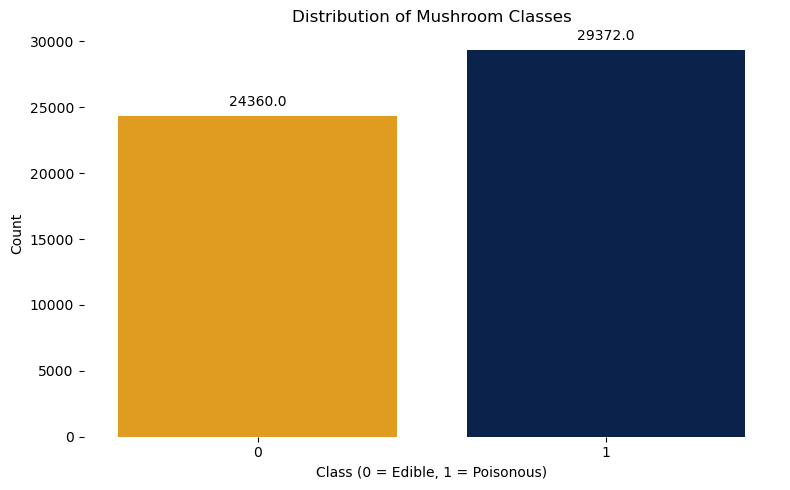

In [59]:
# Count the occurrences of each class (target)
class_counts = df_no_duplicates['class'].value_counts()

# Print class counts
print("Class Counts:")
print(class_counts)

# colors for bar plot
bar_colors = ['#FFA500', '#001F54'] 

# Plot
fig, ax = plt.subplots(figsize=(8, 5))

# Bar plot for class distribution
sns.barplot(x=class_counts.index, y=class_counts, ax=ax, palette=bar_colors)
ax.set_title('Distribution of Mushroom Classes')
ax.set_ylabel('Count')
ax.set_xlabel('Class (0 = Edible, 1 = Poisonous)')

# Annotate counts on the bar chart
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', 
                xytext=(0, 10), textcoords='offset points')

# Remove unnecessary spines
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()



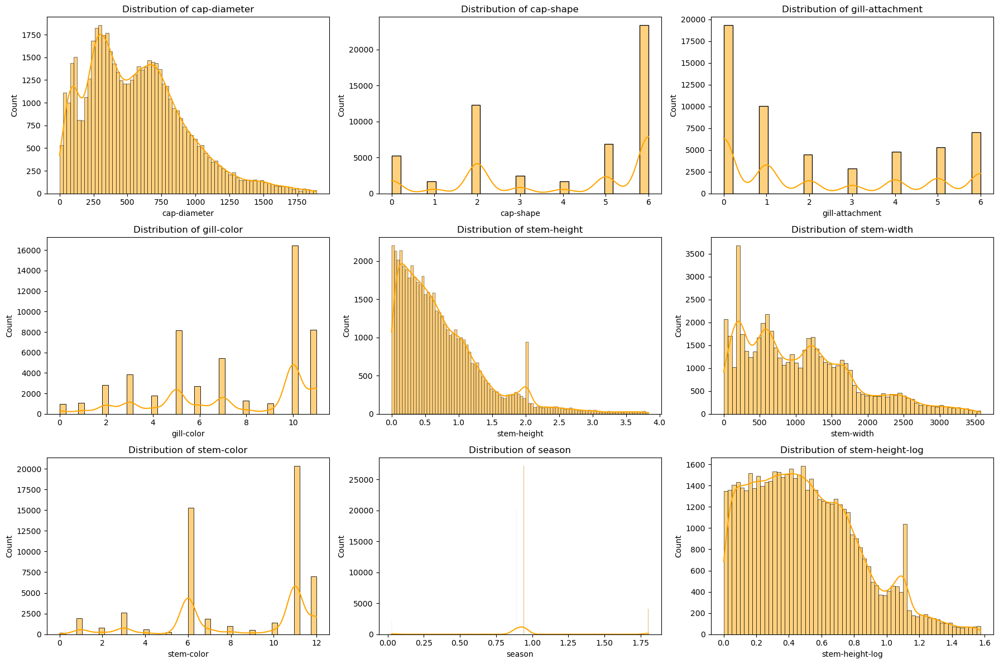

In [60]:
#Feature Distribution Visualization
features_to_plot = df_no_duplicates.drop(columns=['class'])

# Create histograms for all features excluding the target column ('class') 
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))
axes = axes.flatten()

for idx, col in enumerate(features_to_plot.columns):
    sns.histplot(data=features_to_plot, x=col, ax=axes[idx], kde=True, color='#FFA500')
    axes[idx].set_title(f'Distribution of {col}')
    axes[idx].set_xlabel(col)

for i in range(len(features_to_plot.columns), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

#### Box plot to check the outliers of the data

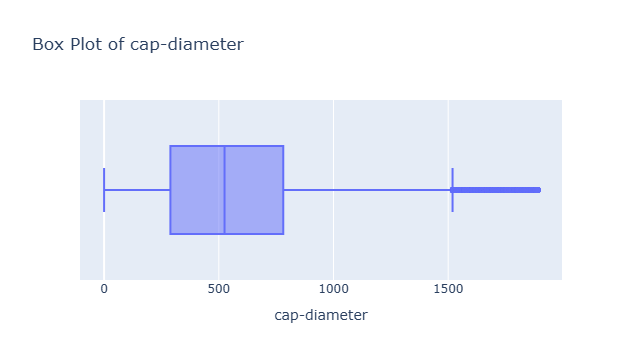

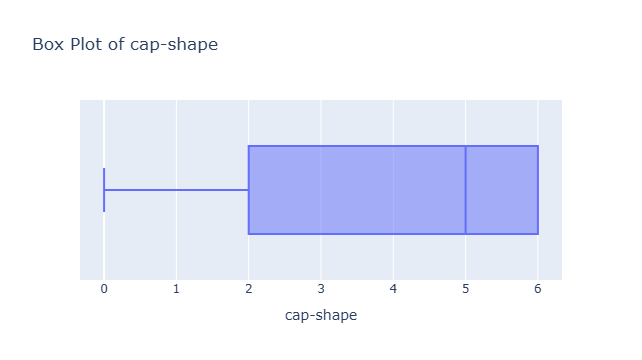

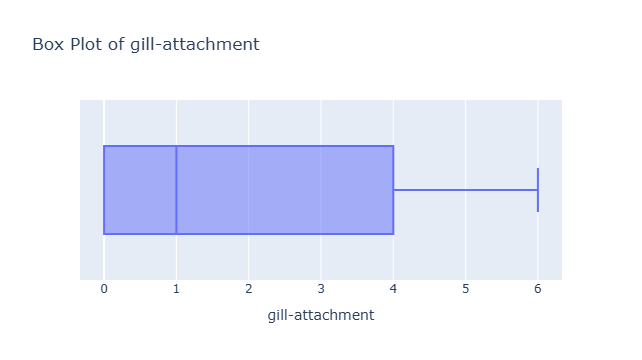

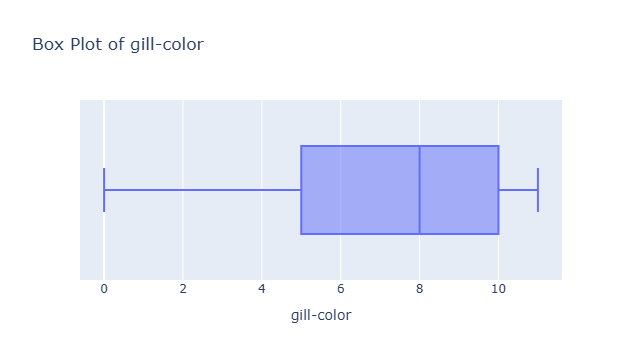

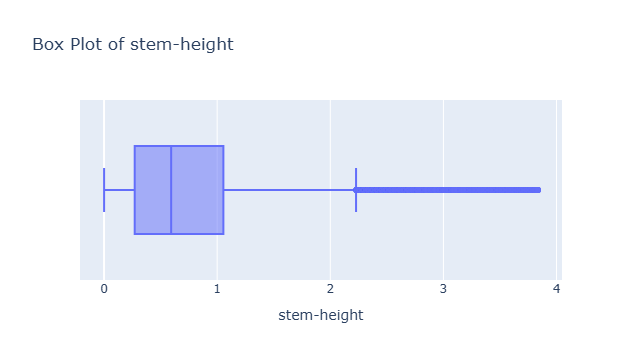

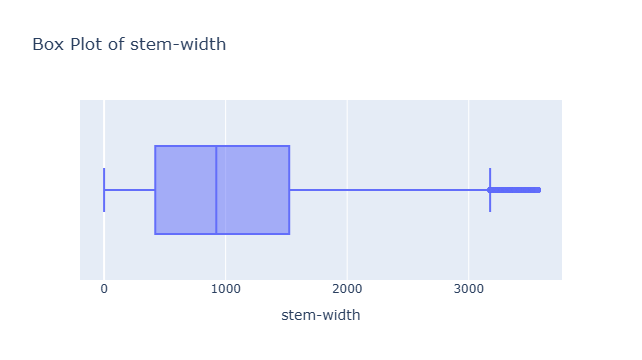

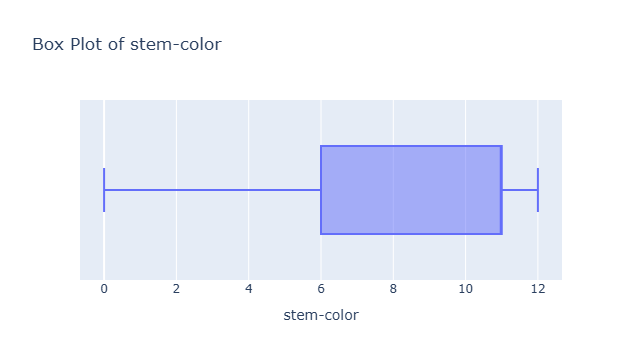

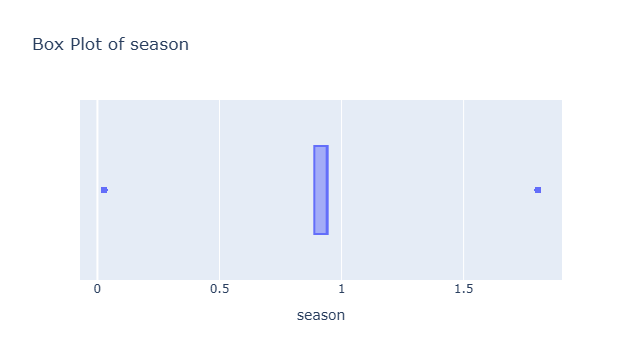

In [13]:
columns = ['cap-diameter', 'cap-shape', 'gill-attachment', 'gill-color',
           'stem-height', 'stem-width', 'stem-color', 'season']
figs = []

for column in columns:
    fig = px.box(df, x=column, title=f'Box Plot of {column}')
    figs.append(fig)

for fig in figs:
    fig.show()

#### Correlation Matrix 

<Axes: >

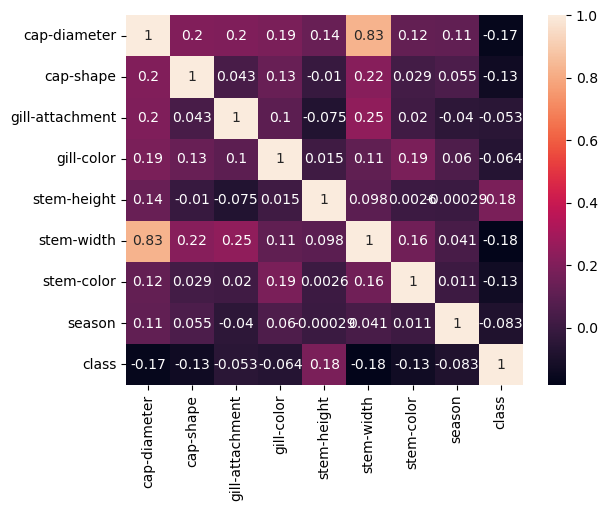

In [16]:
sns.heatmap(df.corr() ,annot= True)

In [17]:
corr_matrix=df.corr()
corr_matrix["class"].sort_values(ascending=False)

class              1.000000
stem-height        0.183354
gill-attachment   -0.052541
gill-color        -0.063947
season            -0.082919
stem-color        -0.128339
cap-shape         -0.133338
cap-diameter      -0.165676
stem-width        -0.182856
Name: class, dtype: float64

# Data Cleaning and Preprocessing

In [4]:
# Check for missing and duplicated values
print(f'\nMissing values: {df.isna().sum().sum()}')
print(f'Duplicated values: {df.duplicated().sum()}')


Missing values: 0
Duplicated values: 303


In [5]:
# Display duplicated rows
duplicated_rows = df[df.duplicated()]
duplicated_rows.head()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
8815,69,6,0,10,1.206059,125,1,0.888450,1
11930,27,6,0,11,1.054858,24,12,0.888450,1
33640,204,0,0,5,0.154755,271,6,0.027372,1
50246,384,3,0,10,2.013794,0,2,0.888450,1
50290,382,3,0,10,2.013794,0,2,0.888450,1


In [6]:
# Summary of Duplicated Rows
duplicated_rows_summary = duplicated_rows.describe(include='all')
duplicated_rows_summary

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.0
mean,323.960396,3.009901,2.000000,4.653465,2.001828,1.386139,2.042904,0.924028,1.0
std,77.829614,0.298840,1.416553,3.770140,0.128473,17.172655,0.620943,0.536582,0.0
min,27.000000,0.000000,0.000000,2.000000,0.154755,0.000000,1.000000,0.027372,1.0
25%,263.000000,3.000000,0.000000,2.000000,2.013794,0.000000,2.000000,0.888450,1.0
50%,311.000000,3.000000,3.000000,2.000000,2.013794,0.000000,2.000000,0.888450,1.0
75%,383.000000,3.000000,3.000000,10.000000,2.013794,0.000000,2.000000,0.943195,1.0
max,542.000000,6.000000,3.000000,11.000000,2.013794,271.000000,12.000000,1.804273,1.0


* All Duplicated Rows Are Poisonous: The class column indicates that all duplicated rows belong to class 1 (poisonous).

In [7]:
# Remove duplicated rows and reset the index
df_no_duplicates = df.drop_duplicates().reset_index(drop=True)

# Confirm the new shape of the dataset after removing duplicates
new_shape = df_no_duplicates.shape

new_shape

(53732, 9)

* Original Rows: 54,035
* Rows After Removing Duplicates: 53,732

#### Z-score and Outlier Removal

In [61]:
# Calculate the z-scores for each column in the DataFrame
df_z_scores = df_no_duplicates.apply(zscore)

# Generate descriptive statistics for the z-scores, rounded to three decimal places
z_scores_stats = df_z_scores.describe().round(3)
# Identify rows where any of the z-scores exceed the threshold
threshold = 3
outliers = (df_z_scores.abs() > threshold).any(axis=1)

# Filter the DataFrame to remove the outlier rows
df_no_outliers = df_no_duplicates[~outliers]

# Calculate the number of rows in the original DataFrame, the new one, and how many were removed
original_rows = df_no_duplicates.shape[0]
new_rows = df_no_outliers.shape[0]
removed_rows = original_rows - new_rows

print("\nSummary of Rows:")
print(f"Original number of rows: {original_rows}")
print(f"Number of rows after removing outliers: {new_rows}")
print(f"Number of rows removed: {removed_rows}")


Summary of Rows:
Original number of rows: 53732
Number of rows after removing outliers: 50131
Number of rows removed: 3601


#### Log Transformation for Skewness Reduction

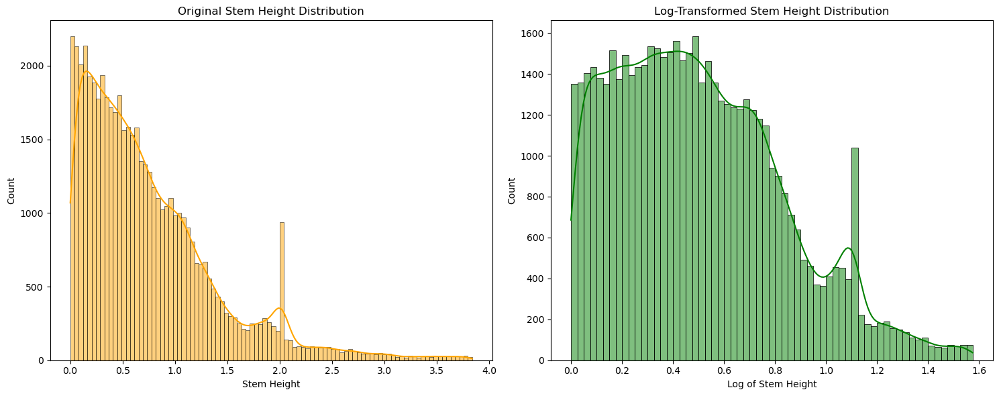

In [18]:
skewness_values = {
    'Feature': ['Cap Diameter', 'Stem Height', 'Stem Width'],
    'Skewness': [
        df_no_duplicates['cap-diameter'].skew(),
        df_no_duplicates['stem-height'].skew(),
        df_no_duplicates['stem-width'].skew()
    ]
}
# Apply log transformation to 'stem-height'
df_no_duplicates['stem-height-log'] = np.log1p(df_no_duplicates['stem-height'])

# Set up the figure for before and after comparison
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

# Original stem-height distribution
sns.histplot(df_no_duplicates['stem-height'], kde=True, ax=axes[0], color='orange')
axes[0].set_title('Original Stem Height Distribution')
axes[0].set_xlabel('Stem Height')

# Log-transformed stem-height distribution
sns.histplot(df_no_duplicates['stem-height-log'], kde=True, ax=axes[1], color='green')
axes[1].set_title('Log-Transformed Stem Height Distribution')
axes[1].set_xlabel('Log of Stem Height')
plt.tight_layout()
plt.show()

In [19]:
# Separate Features and Target
x = df_no_duplicates.drop(columns=['class'],axis=1)
y = df_no_duplicates['class']

In [22]:
# Data Scaling using StandardScaler
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)

In [27]:
# Train/Test Split
x_train,x_test, y_train, y_test = train_test_split(x_scaled,y,train_size=0.8, random_state=100)


# Machine Learning: Supervised learning

## KNN Algorithm

In [28]:
knn= KNeighborsClassifier(n_neighbors= 3)
knn.fit(x_train,y_train)
y_pred = knn.predict(x_test)
print(classification_report(y_test, y_pred=y_pred))
knn_acc = accuracy_score(y_test, y_pred=y_pred)
knn_precision = precision_score(y_test, y_pred=y_pred)
knn_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      4846
           1       0.99      0.99      0.99      5901

    accuracy                           0.99     10747
   macro avg       0.99      0.99      0.99     10747
weighted avg       0.99      0.99      0.99     10747



Text(95.72222222222221, 0.5, 'Truth')

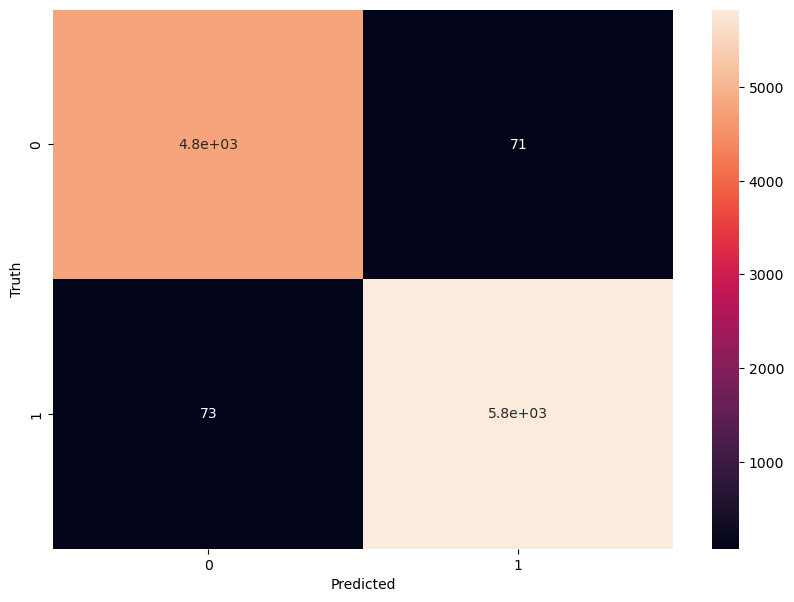

In [29]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## Naive Bayes Classifier

In [31]:
nb= GaussianNB()
nb.fit(x_train,y_train)
y_pred = nb.predict(x_test)
print(classification_report(y_test, y_pred=y_pred))
nb_acc = accuracy_score(y_test, y_pred=y_pred)
nb_precision = precision_score(y_test, y_pred=y_pred)
nb_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.60      0.57      0.58      4846
           1       0.66      0.69      0.68      5901

    accuracy                           0.64     10747
   macro avg       0.63      0.63      0.63     10747
weighted avg       0.63      0.64      0.64     10747



Text(95.72222222222221, 0.5, 'Truth')

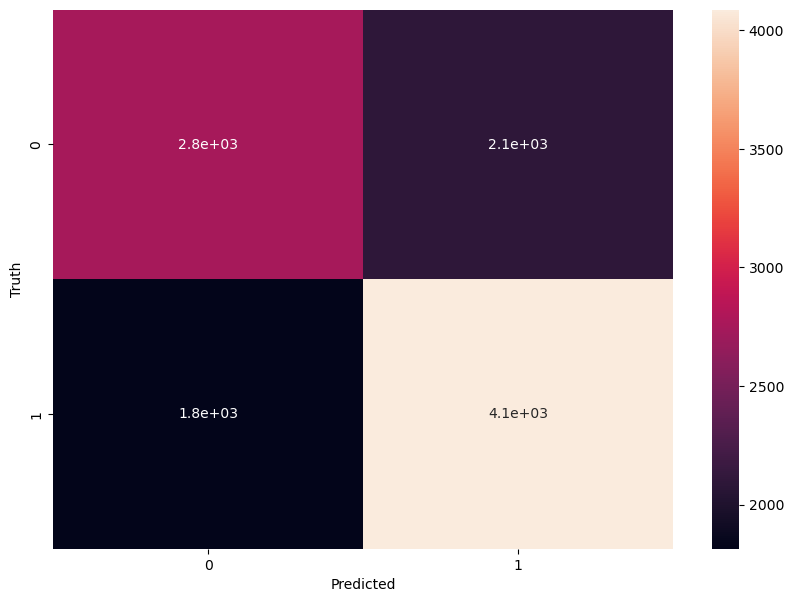

In [33]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## Logistic Regression Algorithm

In [62]:
lgr = LogisticRegression(max_iter=1000)
lgr.fit(x_train, y_train)

# Predictions
y_pred = lgr.predict(x_test)

# Metrics
print(classification_report(y_test, y_pred=y_pred))
lr_acc = accuracy_score(y_test, y_pred=y_pred)
lr_precision = precision_score(y_test, y_pred=y_pred, average='weighted')  # 'weighted' for multi-class
lr_f1 = f1_score(y_test, y_pred=y_pred, average='weighted')  

# Print metrics
print(f"Accuracy: {lr_acc:.4f}")
print(f"Precision: {lr_precision:.4f}")
print(f"F1 Score: {lr_f1:.4f}")

              precision    recall  f1-score   support

           0       0.60      0.53      0.56      4846
           1       0.65      0.71      0.68      5901

    accuracy                           0.63     10747
   macro avg       0.62      0.62      0.62     10747
weighted avg       0.63      0.63      0.62     10747

Accuracy: 0.6277
Precision: 0.6252
F1 Score: 0.6247


Text(95.72222222222221, 0.5, 'Truth')

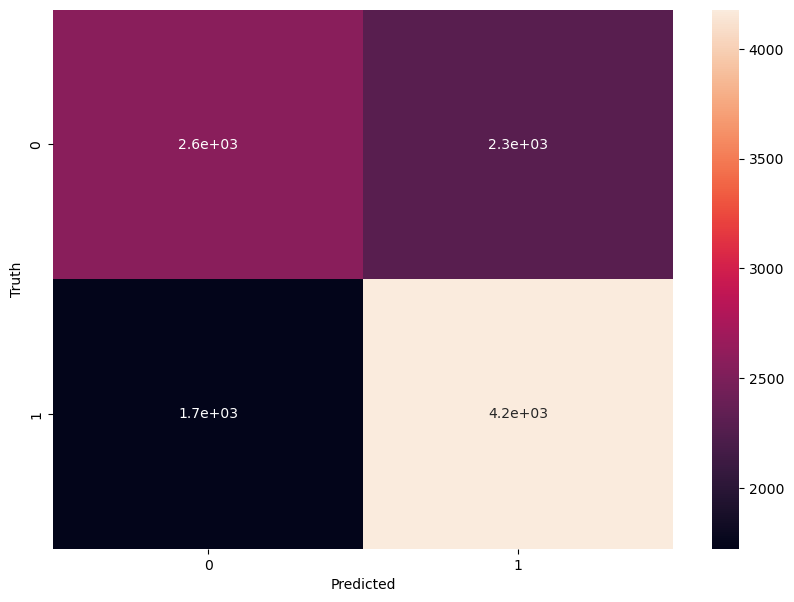

In [37]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## SVM Algorithm

In [39]:
svm= SVC()
svm.fit(x_train,y_train)
y_pred = svm.predict(x_test)
print(classification_report(y_test, y_pred=y_pred))
svm_acc = accuracy_score(y_test, y_pred=y_pred)
svm_precision = precision_score(y_test, y_pred=y_pred)
svm_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.88      0.88      0.88      4846
           1       0.90      0.91      0.90      5901

    accuracy                           0.89     10747
   macro avg       0.89      0.89      0.89     10747
weighted avg       0.89      0.89      0.89     10747



Text(95.72222222222221, 0.5, 'Truth')

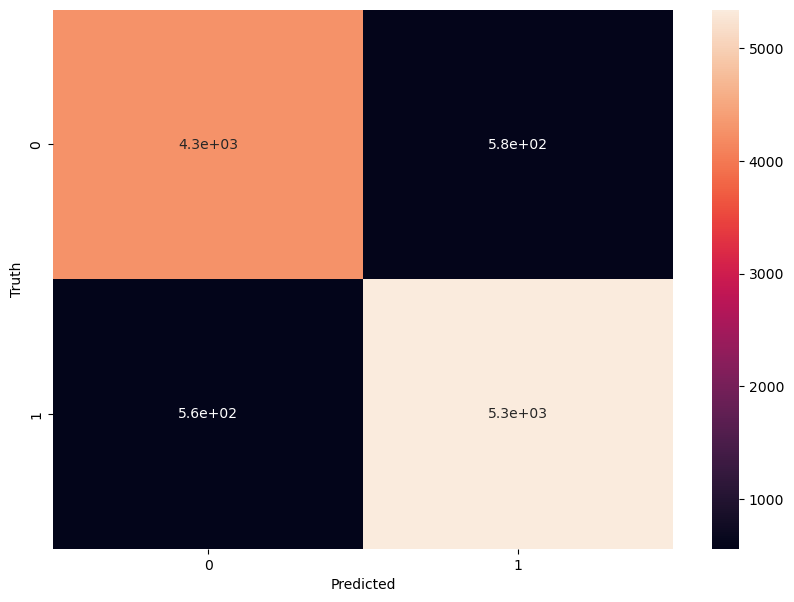

In [40]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## Random Forest Algorithm (Ensemble ML)

In [42]:
rf= RandomForestClassifier(n_estimators=93)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
print(classification_report(y_test, y_pred=y_pred))
rf_acc = accuracy_score(y_test, y_pred=y_pred)
rf_precision = precision_score(y_test, y_pred=y_pred)
rf_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4846
           1       0.99      0.99      0.99      5901

    accuracy                           0.99     10747
   macro avg       0.99      0.99      0.99     10747
weighted avg       0.99      0.99      0.99     10747



Text(95.72222222222221, 0.5, 'Truth')

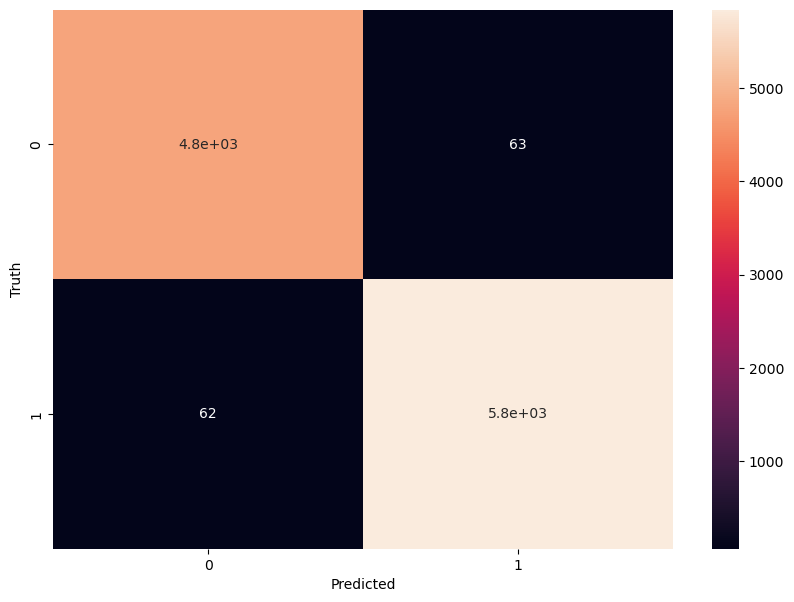

In [43]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## XGBoost Algorithm

In [44]:
xgb = XGBClassifier(n_jobs=-1, n_estimators=95, max_depth=8).fit(x_train, y_train)
y_pred = xgb.predict(x_test)


print(classification_report(y_test, y_pred=y_pred))
xgb_acc = accuracy_score(y_test, y_pred=y_pred)
xgb_precision = precision_score(y_test, y_pred=y_pred)
xgb_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4846
           1       0.99      0.99      0.99      5901

    accuracy                           0.99     10747
   macro avg       0.99      0.99      0.99     10747
weighted avg       0.99      0.99      0.99     10747



Text(95.72222222222221, 0.5, 'Truth')

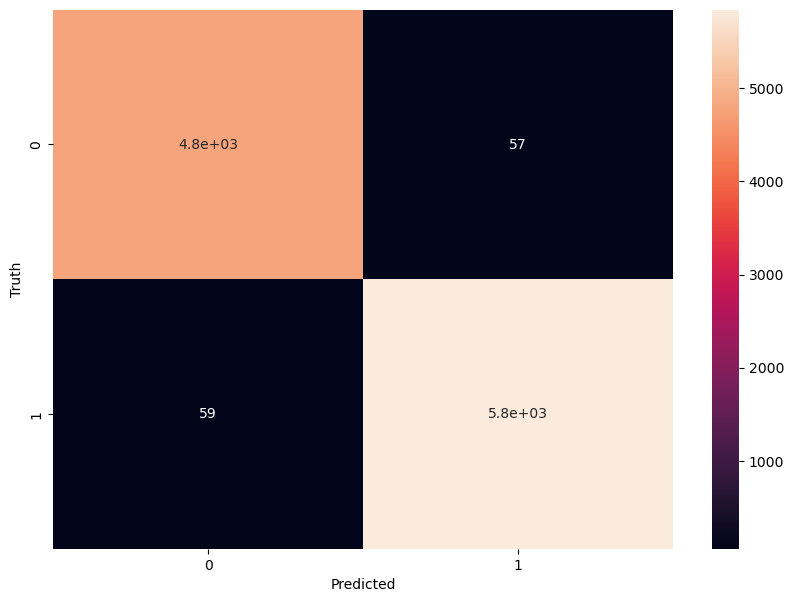

In [45]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## CatBoost Algorithm

In [46]:
cat= CatBoostClassifier(verbose=0).fit(x_train, y_train)
y_pred=cat.predict(x_test)
print(classification_report(y_test, y_pred=y_pred))
cat_acc = accuracy_score(y_test, y_pred=y_pred)
cat_precision = precision_score(y_test, y_pred=y_pred)
cat_f1= f1_score(y_test, y_pred=y_pred)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4846
           1       0.99      0.99      0.99      5901

    accuracy                           0.99     10747
   macro avg       0.99      0.99      0.99     10747
weighted avg       0.99      0.99      0.99     10747



Text(95.72222222222221, 0.5, 'Truth')

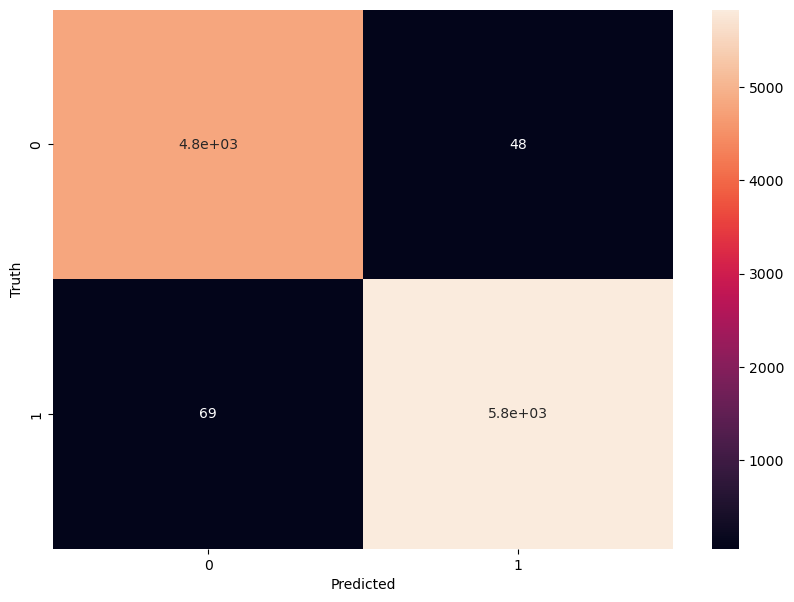

In [47]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

## Summary of Supervised Algorithms

In [63]:
#  dictionary with classification results
s = {
    "Classifications": ["KNN", "Naive Bayes", "Logistic Regression", "SVM", "Random Forest","XGBoost","CatBoost"],
    "Accuracy": [knn_acc, nb_acc, lr_acc, svm_acc, rf_acc,xgb_acc, cat_acc],
    "Precision": [knn_precision, nb_precision, lr_precision, svm_precision, rf_precision,xgb_precision, cat_precision],
    "F1 Score": [knn_f1, nb_f1, lr_f1, svm_f1, rf_f1,xgb_f1, cat_f1]
}

# Convert the results to a NumPy array and transpose it
data = np.array([s["Accuracy"], s["Precision"], s["F1 Score"]]).T

# Print the data
print(data)


[[0.98660091 0.98796406 0.98779661]
 [0.63645669 0.66132686 0.67659962]
 [0.62771006 0.62519138 0.62474925]
 [0.89392389 0.90163658 0.90361853]
 [0.98836885 0.98932565 0.98940947]
 [0.98920629 0.99033735 0.99016949]
 [0.98911324 0.99183673 0.99006875]]


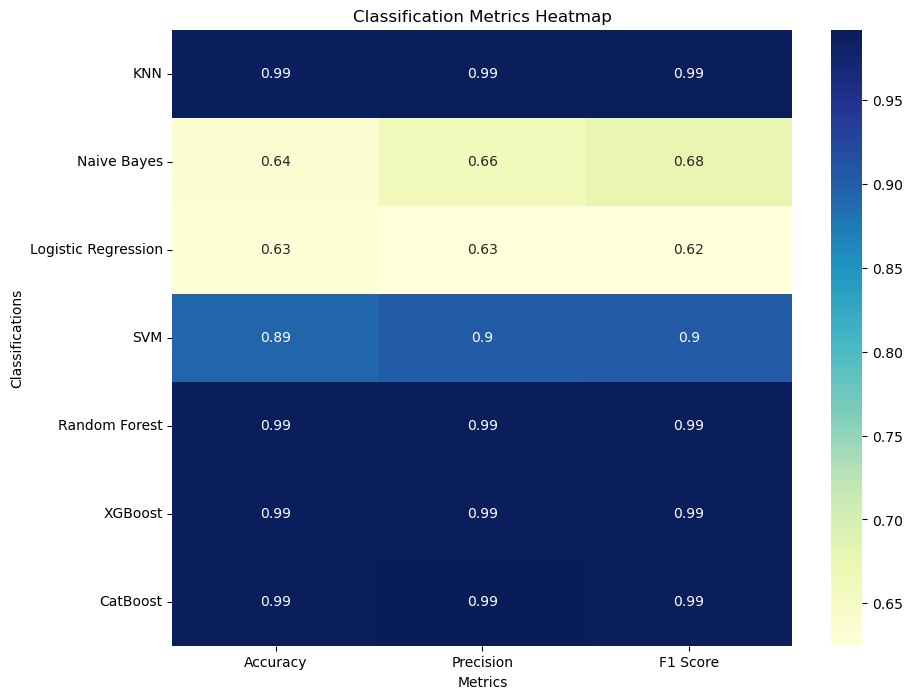

In [57]:
# Create labels for the heatmap
labels = ["Accuracy", "Precision", "F1 Score"]
classifications = s["Classifications"]
plt.figure(figsize=(10, 8))
sns.heatmap(data, annot=True, xticklabels=labels, yticklabels=classifications, cmap="YlGnBu")
plt.title("Classification Metrics Heatmap")
plt.xlabel("Metrics")
plt.ylabel("Classifications")
plt.show()

# Deep learning

## Neural Network

In [49]:
nn_model = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="relu", input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dropout(0.05),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dropout(0.05),
    # Last layer should be just one neuron
    # We should use the sigmoid function because the output must be in between 0 and 1
    tf.keras.layers.Dense(1, activation="sigmoid")
])
nn_model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="binary_crossentropy", metrics=["accuracy"])

y_pred_proba = nn_model.predict(x_test)  # Predict probabilities
y_pred = (y_pred_proba > 0.5).astype(int).flatten()  
print(classification_report(y_test, y_pred=y_pred))
nn_acc = accuracy_score(y_test, y_pred=y_pred)
nn_precision = precision_score(y_test, y_pred=y_pred)
nn_f1 = f1_score(y_test, y_pred=y_pred)

# Print the results
print(f"Neural Network Accuracy: {nn_acc:.2f}")
print(f"Neural Network Precision: {nn_precision:.2f}")
print(f"Neural Network F1 Score: {nn_f1:.2f}")

C:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


336/336 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step
              precision    recall  f1-score   support

           0       0.34      0.06      0.11      4846
           1       0.54      0.90      0.67      5901

    accuracy                           0.52     10747
   macro avg       0.44      0.48      0.39     10747
weighted avg       0.45      0.52      0.42     10747

Neural Network Accuracy: 0.52
Neural Network Precision: 0.54
Neural Network F1 Score: 0.67


## RNN

In [50]:

# Reshape data for RNN (Add time dimension)
# Assuming input features are not time-series data, we add a dummy time step of 1
x_train_rnn = x_train[:, :, np.newaxis]
x_test_rnn = x_test[:, :, np.newaxis]

# Initialize the RNN model
rnn_model = tf.keras.Sequential([
    tf.keras.layers.SimpleRNN(32, activation="relu", input_shape=(x_train_rnn.shape[1], x_train_rnn.shape[2])),
    tf.keras.layers.Dense(1, activation="sigmoid")  # For binary classification
])

# Compile the RNN model
rnn_model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss="binary_crossentropy", metrics=["accuracy"])

# Train the RNN model
rnn_model.fit(x_train_rnn, y_train, epochs=10, batch_size=32, verbose=1)
# Predictions
y_pred_proba = rnn_model.predict(x_test_rnn)  # Predict probabilities
y_pred = (y_pred_proba > 0.5).astype(int).flatten()  # Convert probabilities to binary (0 or 1)

# Metrics
print(classification_report(y_test, y_pred=y_pred))
rnn_acc = accuracy_score(y_test, y_pred=y_pred)
rnn_precision = precision_score(y_test, y_pred=y_pred, average='weighted')
rnn_f1 = f1_score(y_test, y_pred=y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {rnn_acc:.4f}")
print(f"Precision: {rnn_precision:.4f}")
print(f"F1 Score: {rnn_f1:.4f}")


C:\Users\DELL\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 11s 5ms/step - accuracy: 0.6791 - loss: 0.5817
Epoch 2/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8379 - loss: 0.3654
Epoch 3/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8819 - loss: 0.2878
Epoch 4/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9108 - loss: 0.2323
Epoch 5/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9170 - loss: 0.2114
Epoch 6/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9266 - loss: 0.1903
Epoch 7/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9300 - loss: 0.1805
Epoch 8/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9362 - loss: 0.1676
Epoch 9/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9386 - loss: 0.1622
Epoch 10/10
1344/1344 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9424 - loss: 0.1530
336/336 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
              precision    recall  f1-score   support

           0       0.9

## Autoencoders for Classification

In [64]:


# Define the Autoencoder
input_dim = x_train.shape[1]

# Define the encoder
encoder_input = Input(shape=(input_dim,))
encoded = Dense(32, activation="relu")(encoder_input)
encoded = Dense(16, activation="relu", name="latent_space")(encoded)

# Define the decoder
decoded = Dense(32, activation="relu")(encoded)
decoder_output = Dense(input_dim, activation="sigmoid")(decoded)

# Autoencoder Model
autoencoder = Model(encoder_input, decoder_output)
autoencoder.compile(optimizer="adam", loss="mse")
autoencoder.summary()
# Train the autoencoder
autoencoder.fit(x_train, x_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

#  Extract Latent Features
# Ensure the model is initialized by calling it
_ = autoencoder.predict(x_train[:1])

# Extract latent space
encoder_output = autoencoder.get_layer("latent_space").output
encoder = tf.keras.Model(inputs=autoencoder.input, outputs=encoder_output)

# Encode train and test data
x_train_encoded = encoder.predict(x_train)
x_test_encoded = encoder.predict(x_test)

#  Train a Classifier on Latent Features
# Using Logistic Regression as the classifier

classifier = LogisticRegression(max_iter=1000)
classifier.fit(x_train_encoded, y_train)
# Predict on the test set
y_pred = classifier.predict(x_test_encoded)

#  Evaluate the Classifier
print(classification_report(y_test, y_pred=y_pred))
autoencoder_acc = accuracy_score(y_test, y_pred=y_pred)
autoencoder_precision = precision_score(y_test, y_pred=y_pred, average='weighted')
autoencoder_f1 = f1_score(y_test, y_pred=y_pred, average='weighted')

# Print metrics
print(f"Accuracy: {autoencoder_acc:.4f}")
print(f"Precision: {autoencoder_precision:.4f}")
print(f"F1 Score: {autoencoder_f1:.4f}")

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 9)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 32)             │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_space (Dense)            │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 32)             │           544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 9)              │           297 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,689 (6.60 KB)

 Trainable params: 1,689 (6.60 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - loss: 0.8090 - val_loss: 0.5643
Epoch 2/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5673 - val_loss: 0.5612
Epoch 3/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 0.5634 - val_loss: 0.5585
Epoch 4/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5634 - val_loss: 0.5570
Epoch 5/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5585 - val_loss: 0.5566
Epoch 6/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5617 - val_loss: 0.5566
Epoch 7/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5580 - val_loss: 0.5564
Epoch 8/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5615 - val_loss: 0.5563
Epoch 9/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - loss: 0.5622 - val_loss: 0.5562
Epoch 10/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5580 - val_loss: 0.5562
Epoch 11/20
1075/1075 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.5587 - val_loss: 0.5561
Epoch 12/20
1075/1075 ━━━━━━━━